# Integrate with Amazon Bedrock Knowledge Bases:
After processed the audio and video files with a BDA project, next it is time to integrate with Bedrock KB.
## Steps involved in this integration: 
- Set up a knowledge base to parse documents using Amazon Bedrock Data Automation as the parser.
- Ingest the processed data into the knowledge base for retrieval and response generation.

<div class="alert alert-block alert-info">
<b>Note:</b> Please run this notebook after you finish running the first notebook: 01_data_prep_using_bda.ipynb, the notebook cell one at a time instead of using "Run All Cells" option.
</div>

## Prerequisites
Please make sure to enable `Anthropic Claude 3 Sonnet` , `Amazon Nova Micro` and  `Titan Text Embeddings V2` model access in Amazon Bedrock Console

You need to have suitable IAM role permission to run this notebook. For IAM role, choose either an existing IAM role in your account or create a new role. The role must the necessary permissions to invoke the BDA, Bedrock KB, create IAM roles, SageMaker and S3 APIs.

Note: The AdministratorAccess IAM policy can be used, if allowed by security policies at your organization.

<div class="alert alert-block alert-info">
<b>Note:</b> Please run the notebook cell one at a time instead of using "Run All Cells" option.
</div>

# Setup notebook and boto3 clients

In this step, we will import some necessary libraries that will be used throughout this notebook. To use Amazon Bedrock Data Automation (BDA) with boto3, you'll need to ensure you have the latest version of the AWS SDK for Python (boto3) installed. Version Boto3 1.35.96 of later is required.

Note: At time of Public Preview launch, BDA is available in us-west-2 only.

In [1]:
%pip install -r ./requirements.txt --no-deps --quiet

Note: you may need to restart the kernel to use updated packages.


In [2]:
# restart kernel
from IPython.core.display import HTML
HTML("<script>Jupyter.notebook.kernel.restart()</script>")


In [3]:
%load_ext autoreload
%autoreload 2

import warnings
warnings.filterwarnings('ignore')

<div class="alert alert-block alert-info">
<b>Note:</b> In this workshop, a new S3 bucket following the naming convention "kb-bda-multimodal-datasource-{account_id}" will be used, and the input and output will be saved under a folder called "bda" in the default bucket.
</div>

In [4]:
import boto3
from botocore.exceptions import ClientError
from datetime import datetime
import time
from time import sleep
import pprint
import random
from tqdm import tqdm
from pathlib import Path
from IPython.display import JSON, IFrame, Audio, display, clear_output
import IPython.display as display
import logging
import sys
from pathlib import Path
import base64

# Now you can import from utils
from utils.knowledge_base import BedrockKnowledgeBase

[03/05/25 17:42:32] INFO     Found credentials from IAM Role:                                   ]8;id=828754;file:///home/ec2-user/anaconda3/envs/python3/lib/python3.10/site-packages/botocore/credentials.py\credentials.py]8;;\:]8;id=62234;file:///home/ec2-user/anaconda3/envs/python3/lib/python3.10/site-packages/botocore/credentials.py#1132\1132]8;;\
                             BaseNotebookInstanceEc2InstanceRole                                                   

sagemaker.config INFO - Not applying SDK defaults from location: /etc/xdg/sagemaker/config.yaml
sagemaker.config INFO - Not applying SDK defaults from location: /home/ec2-user/.config/sagemaker/config.yaml


In [5]:
#Clients
suffix = random.randrange(200, 900)

sts_client = boto3.client('sts')
account_id = sts_client.get_caller_identity()["Account"]

bucket_name_kb = f'bedrock-kb-{suffix}-1' # replace it with your first bucket name.
region_name = "us-west-2" # can be removed ones BDA is GA and available in other regions.
region = region_name

s3_client = boto3.client('s3', region_name=region_name)

bda_client = boto3.client('bedrock-data-automation', region_name=region_name)
bda_runtime_client = boto3.client('bedrock-data-automation-runtime', region_name=region_name)

bedrock_agent_client = boto3.client('bedrock-agent')
bedrock_agent_runtime_client = boto3.client('bedrock-agent-runtime') 

logging.basicConfig(format='[%(asctime)s] p%(process)s {%(filename)s:%(lineno)d} %(levelname)s - %(message)s', level=logging.INFO)
logger = logging.getLogger(__name__)

[03/05/25 17:42:40] INFO     Found credentials from IAM Role:                                   ]8;id=288057;file:///home/ec2-user/anaconda3/envs/python3/lib/python3.10/site-packages/botocore/credentials.py\credentials.py]8;;\:]8;id=772156;file:///home/ec2-user/anaconda3/envs/python3/lib/python3.10/site-packages/botocore/credentials.py#1132\1132]8;;\
                             BaseNotebookInstanceEc2InstanceRole                                                   

In [6]:
# Copy local BDA output files to a S3 bucket for KB integration
# Function to check if the bucket exists, if not, create the data_bucket
from utils.knowledge_base_operators import bucket_exists
suffix = random.randrange(200, 900)
bucket_name_kb = f'bedrock-bda-kb-{suffix}-1'            
# Create S3 bucket for the KB if it doesn't exist
if not bucket_exists(bucket_name_kb):
    print(f"Bucket '{bucket_name_kb}' does not exist. Creating it now...")
    if region == "us-east-1":
        s3_client.create_bucket(Bucket=bucket_name_kb)
    else:
        s3_client.create_bucket(
            Bucket=bucket_name_kb,
            CreateBucketConfiguration={'LocationConstraint': region}
        )
    print(f"Bucket '{bucket_name_kb}' created successfully.")
else:
    print(f"Bucket '{bucket_name_kb}' already exists.")


obj_audio = 'bda/dataset/result_aud.json'  
s3_client.upload_file('result_aud.json', bucket_name_kb, obj_audio)

obj_video = 'bda/dataset/result_vid.json'  
s3_client.upload_file('result_vid.json', bucket_name_kb, obj_video)

# copy pdf file and image file to bda_kb_bucket_name
file_name_doc = 'examples/bedrock-ug.pdf'
obj_doc = f"bda/dataset/{file_name_doc}"

file_name_img = 'examples/bda-idp.png'
obj_img = f"bda/dataset/{file_name_img}"

s3_client.upload_file(file_name_doc, bucket_name_kb, obj_doc )
s3_client.upload_file(file_name_img, bucket_name_kb, obj_img )


[03/05/25 17:42:51] INFO     Found credentials from IAM Role:                                   ]8;id=550162;file:///home/ec2-user/anaconda3/envs/python3/lib/python3.10/site-packages/botocore/credentials.py\credentials.py]8;;\:]8;id=139626;file:///home/ec2-user/anaconda3/envs/python3/lib/python3.10/site-packages/botocore/credentials.py#1132\1132]8;;\
                             BaseNotebookInstanceEc2InstanceRole                                                   

Bucket 'bedrock-bda-kb-708-1' does not exist. Creating it now...
Bucket 'bedrock-bda-kb-708-1' created successfully.


In [7]:
# Get the current timestamp
current_time = time.time()

# Format the timestamp as a string
timestamp_str = time.strftime("%Y%m%d%H%M%S", time.localtime(current_time))[-7:]
# Create the suffix using the timestamp
suffix = f"{timestamp_str}"

knowledge_base_name = f"bedrock-multi-modal-kb-{suffix}"
knowledge_base_description = "Multi-modal RAG knowledge base."

foundation_model = "anthropic.claude-3-sonnet-20240229-v1:0"

### Start the Knowledge Base creation 

In this notebook, the process of creating a KB is simplified by using a wrapper function from the knowledge_base.py file in "utils" folder of this notebook. The whole process of creating data source, creating a KB, creating an embedding index, saving the index in a vector data store is simplified by using this function. 


In [8]:
## Please uncomment the data sources that you want to add and update the placeholder values accordingly.

#data=[{"type": "S3", "bucket_name": bucket_name, "inclusionPrefixes": ["bda/dataset/"]}]
data=[{"type": "S3", "bucket_name": bucket_name_kb}]


                # {"type": "SHAREPOINT", "tenantId": "888d0b57-69f1-4fb8-957f-e1f0bedf64de", "domain": "yourdomain",
                #   "authType": "OAUTH2_CLIENT_CREDENTIALS",
                #  "credentialsSecretArn": f"arn:aws::secretsmanager:{region_name}:secret:<<your_secret_name>>",
                #  "siteUrls": ["https://yourdomain.sharepoint.com/sites/mysite"]
                # },
    
                
pp = pprint.PrettyPrinter(indent=2)

### Step 1 - Create Knowledge Base with Multi modality

In [9]:
# For multi-modal RAG While instantiating BedrockKnowledgeBase, pass multi_modal= True and choose the parser you want to use

knowledge_base = BedrockKnowledgeBase(
    kb_name=f'{knowledge_base_name}',
    kb_description=knowledge_base_description,
    data_sources=data,
    multi_modal= True,
    parser= 'BEDROCK_DATA_AUTOMATION', #'BEDROCK_Data Automation service is used'
    chunking_strategy = "FIXED_SIZE", 
    suffix = f'{suffix}-f'
)

[03/05/25 17:43:01] INFO     Found credentials from IAM Role:                                   ]8;id=29020;file:///home/ec2-user/anaconda3/envs/python3/lib/python3.10/site-packages/botocore/credentials.py\credentials.py]8;;\:]8;id=214631;file:///home/ec2-user/anaconda3/envs/python3/lib/python3.10/site-packages/botocore/credentials.py#1132\1132]8;;\
                             BaseNotebookInstanceEc2InstanceRole                                                   

[03/05/25 17:43:02] INFO     Found credentials from IAM Role:                                   ]8;id=102230;file:///home/ec2-user/anaconda3/envs/python3/lib/python3.10/site-packages/botocore/credentials.py\credentials.py]8;;\:]8;id=397317;file:///home/ec2-user/anaconda3/envs/python3/lib/python3.10/site-packages/botocore/credentials.py#1132\1132]8;;\
                             BaseNotebookInstanceEc2InstanceRole                                                   

Step 1 - Creating or retrieving S3 bucket(s) for Knowledge Base documents
['bedrock-bda-kb-708-1', 'bedrock-multi-modal-kb-5174258-intermediate-5174258-f']
buckets_to_check:  ['bedrock-bda-kb-708-1', 'bedrock-multi-modal-kb-5174258-intermediate-5174258-f']
Bucket bedrock-bda-kb-708-1 already exists - retrieving it!
Creating bucket bedrock-multi-modal-kb-5174258-intermediate-5174258-f
Step 2 - Creating Knowledge Base Execution Role (AmazonBedrockExecutionRoleForKnowledgeBase_5174258-f) and Policies
Step 3 - Creating OSS encryption, network and data access policies
Step 4 - Creating OSS Collection (this step takes a couple of minutes to complete)
{ 'ResponseMetadata': { 'HTTPHeaders': { 'connection': 'keep-alive',
                                         'content-length': '320',
                                         'content-type': 'application/x-amz-json-1.0',
                                         'date': 'Wed, 05 Mar 2025 17:43:05 '
                                               

[03/05/25 17:44:36] INFO     PUT                                                                        ]8;id=983215;file:///home/ec2-user/anaconda3/envs/python3/lib/python3.10/site-packages/opensearchpy/connection/base.py\base.py]8;;\:]8;id=750081;file:///home/ec2-user/anaconda3/envs/python3/lib/python3.10/site-packages/opensearchpy/connection/base.py#258\258]8;;\
                             https://qklz82yeepmgf41cich3.us-west-2.aoss.amazonaws.com:443/bedrock-samp            
                             le-rag-index-5174258-f                                                                


Creating index:
{ 'acknowledged': True,
  'index': 'bedrock-sample-rag-index-5174258-f',
  'shards_acknowledged': True}
Step 6 - Will create Lambda Function if chunking strategy selected as CUSTOM
Not creating lambda function as chunking strategy is FIXED_SIZE
Step 7 - Creating Knowledge Base
{ 'createdAt': datetime.datetime(2025, 3, 5, 17, 45, 36, 416711, tzinfo=tzlocal()),
  'description': 'Multi-modal RAG knowledge base.',
  'knowledgeBaseArn': 'arn:aws:bedrock:us-west-2:371369928762:knowledge-base/V2CFN0HVUE',
  'knowledgeBaseConfiguration': { 'type': 'VECTOR',
                                  'vectorKnowledgeBaseConfiguration': { 'embeddingModelArn': 'arn:aws:bedrock:us-west-2::foundation-model/amazon.titan-embed-text-v2:0',
                                                                        'supplementalDataStorageConfiguration': { 'storageLocations': [ { 's3Location': { 'uri': 's3://bedrock-multi-modal-kb-5174258-intermediate-5174258-f'},
                                  

### Step 2 - Start data ingestion job to KB

Once the KB and data source(s) created, we can start the ingestion job for each data source. During the ingestion job, KB will fetch the documents from the data source, Parse the document to extract text, chunk it based on the chunking size provided, create embeddings of each chunk and then write it to the vector database, in this case OSS.

NOTE: Currently, you can only kick-off one ingestion job at one time.

In [10]:
# ensure that the kb is available
time.sleep(30)
# sync knowledge base
knowledge_base.start_ingestion_job()

job 1 started successfully

{ 'dataSourceId': 'FQ25AQN4A0',
  'ingestionJobId': '3KABLZEZ02',
  'knowledgeBaseId': 'V2CFN0HVUE',
  'startedAt': datetime.datetime(2025, 3, 5, 17, 46, 18, 337432, tzinfo=tzlocal()),
  'statistics': { 'numberOfDocumentsDeleted': 0,
                  'numberOfDocumentsFailed': 0,
                  'numberOfDocumentsScanned': 4,
                  'numberOfMetadataDocumentsModified': 0,
                  'numberOfMetadataDocumentsScanned': 0,
                  'numberOfModifiedDocumentsIndexed': 0,
                  'numberOfNewDocumentsIndexed': 4},
  'status': 'COMPLETE',
  'updatedAt': datetime.datetime(2025, 3, 5, 17, 47, 20, 662421, tzinfo=tzlocal())}
........................................

In [11]:
# keep the kb_id for invocation later in the invoke request
kb_id = knowledge_base.get_knowledge_base_id()
%store kb_id

'V2CFN0HVUE'
Stored 'kb_id' (str)


### Step 3 -  Test the Knowledge Base
Now the Knowlegde Base is available we can test it out using the [**retrieve**](https://boto3.amazonaws.com/v1/documentation/api/latest/reference/services/bedrock-agent-runtime/client/retrieve.html) and [**retrieve_and_generate**](https://boto3.amazonaws.com/v1/documentation/api/latest/reference/services/bedrock-agent-runtime/client/retrieve_and_generate.html) functions. 

#### Testing Knowledge Base with Retrieve and Generate API

Let's first test the knowledge base using the retrieve and generate API. With this API, Bedrock takes care of retrieving the necessary references from the knowledge base and generating the final answer using a foundation model from Bedrock.

query = Give me the summary of the AWS Rethink podcast hosted by Nolan Chen and Malini Chatterjee?

The right response for this query is expected to fetch from a the audio transcript ingested in Knowledge Bases.

### Step 4: Query Audio File

In [12]:
query = "Give me the summary of the AWS Rethink podcast hosted by Nolan Chen and Malini Chatterjee?"

In [13]:
foundation_model = "anthropic.claude-3-sonnet-20240229-v1:0"
# foundation_model = "amazon.nova-micro-v1:0"

response = bedrock_agent_runtime_client.retrieve_and_generate(
    input={
        "text": query
    },
    retrieveAndGenerateConfiguration={
        "type": "KNOWLEDGE_BASE",
        "knowledgeBaseConfiguration": {
            'knowledgeBaseId': kb_id,
            "modelArn": "arn:aws:bedrock:{}::foundation-model/{}".format(region, foundation_model),
            "retrievalConfiguration": {
                "vectorSearchConfiguration": {
                    "numberOfResults":5
                } 
            }
        }
    }
)

print(response['output']['text'],end='\n'*2)

The AWS Rethink podcast is hosted by Nolan Chen and Malini Chatterjee. In the episode discussed in the search results, they interviewed Ben Schneider to get a recap of AWS Reinvent 2024, which took place earlier that month in Las Vegas. Ben had previously been a guest on the podcast after Reinvent 2023, and the hosts welcomed him back to share his experiences and key takeaways from the 2024 event.



### Directly play the audio file as part of the response

In [14]:
# Extract audio path and timestamps from the response
from utils.knowledge_base_operators import extract_audio_path_and_timestamps
audio_s3_info, timestamps = extract_audio_path_and_timestamps(response)

audio_s3_info

{'bucket': 'bedrock-bda-kb-708-1', 'key': 'bda/dataset/result_aud.json'}

In [ ]:
# Display information for all audio segments first, and play audio file
from utils.knowledge_base_operators import play_audio_segment

    
# Display single audio player after all segments
print("\nAudio Player (click to play):")
print("Note: Please use the time ranges above as reference points in the audio.")
play_audio_segment(audio_s3_info, 0)


Audio Player (click to play):
Note: Please use the time ranges above as reference points in the audio.


### Step 5: Query Video

In [17]:
query = "Can you find a promotional video containing BDA key features?"

In [18]:
foundation_model = "anthropic.claude-3-sonnet-20240229-v1:0"

response = bedrock_agent_runtime_client.retrieve_and_generate(
    input={
        "text": query
    },
    retrieveAndGenerateConfiguration={
        "type": "KNOWLEDGE_BASE",
        "knowledgeBaseConfiguration": {
            'knowledgeBaseId': kb_id,
            "modelArn": "arn:aws:bedrock:{}::foundation-model/{}".format(region, foundation_model),
            "retrievalConfiguration": {
                "vectorSearchConfiguration": {
                    "numberOfResults":5
                } 
            }
        }
    }
)


In [19]:
# Extract video path and timestamps from the response
from IPython.display import HTML
from utils.knowledge_base_operators import parse_response_and_get_s3_info
from utils.knowledge_base_operators import get_video_from_metadata

# Main execution
try:
    # Parse the response
    video_info = parse_response_and_get_s3_info(response)

    if video_info and video_info['s3_uri']:
        if video_info['timestamps']:
            print(f"\nFound {len(video_info['timestamps'])} Video Segments:")
            for ts in video_info['timestamps']:
                print(f"\nShot {ts['shot_index']}:")
                print(f"Time Range: {ts['start_timecode']} - {ts['end_timecode']}")
                print(f"Duration: {ts['duration']/1000:.2f} seconds")
        
        if video_info['summary']:
            print("\nVideo Summary:")
            print(video_info['summary'])
            
        # Get and play the video
        print("\nLoading video player...")

        local_video_path = get_video_from_metadata(
            video_info['s3_uri']['bucket'],
            video_info['s3_uri']['key']
        )
    else:
        print("Could not find video information in response")

except Exception as e:
    print(f"Error in main execution: {e}")    


Video Summary:
The video is an advertisement for Amazon Bedrock Data Automation (BDA), a service that transforms unstructured content into valuable insights, enabling the building of powerful generative AI applications and automating workflows. It explains that BDA can process multimodal content like documents, images, video, and audio through a single API, allowing users to customize outputs tailored to their specific business needs. The video highlights features such as confidence scores, visual grounding, and mitigating hallucinations to improve result reliability. It showcases various visuals, including abstract geometric shapes, gears, cityscapes, and icons representing different data types. The video concludes by displaying the AWS logo and copyright information.

Loading video player...


### Step 6: Query Image

In [20]:
query = "Give me an architecture design of an IDP workflow using Bedrock Data Automation"

In [21]:
foundation_model = "anthropic.claude-3-sonnet-20240229-v1:0"
# foundation_model = "amazon.nova-micro-v1:0"

response = bedrock_agent_runtime_client.retrieve_and_generate(
    input={
        "text": query
    },
    retrieveAndGenerateConfiguration={
        "type": "KNOWLEDGE_BASE",
        "knowledgeBaseConfiguration": {
            'knowledgeBaseId': kb_id,
            "modelArn": "arn:aws:bedrock:{}::foundation-model/{}".format(region, foundation_model),
            "retrievalConfiguration": {
                "vectorSearchConfiguration": {
                    "numberOfResults":5
                } 
            }
        }
    }
)

print(response['output']['text'],end='\n'*2)

Based on the search results, an architecture design for an Intelligent Document Processing (IDP) workflow using Amazon Bedrock Data Automation (BDA) could involve the following steps:

1. A data science team uploads sample documents to Amazon S3 (Simple Storage Service).
2. The team creates and refines blueprints for document processing using Amazon Bedrock. Blueprints define the types of documents, data to extract, and processing logic.
3. The business team (e.g., loan origination team) uploads document bundles to S3.
4. The document bundles go through a series of processing steps using BDA:
   a. Document classification to identify the document type
   b. Data extraction to extract relevant information from the documents
   c. Insight generation to derive valuable insights from the extracted data 5. The processed outputs, including extracted data and insights, are stored in S3 for access by various applications, email systems, and data visualization tools.
6. AWS services like AWS La

In [22]:
from PIL import Image
import s3fs
from IPython.display import display
import mimetypes

fs = s3fs.S3FileSystem()

## Function to print retrieved response

def print_response(response):
#structure 'retrievalResults': list of contents. Each list has ['ResponseMetadata', 'citations', 'output', 'sessionId']
    print( f'OUTPUT: {response["output"]["text"]} \n')
    
    print(f'CITATION DETAILS: \n')
    
    for num, chunk in enumerate(response['citations']):
        print(f'CHUNK {num}',end='\n'*1)
        print("========")
        print(f'\t Generated  Response Text: ')
        print(f'\t ------------------------- ')
        print(f'\t Generated  Response Text: ',chunk['generatedResponsePart']['textResponsePart']['text'],end='\n'*2)
        for i, ref in enumerate (chunk['retrievedReferences']):
            print(f'\t Retrieved References: ')
            print(f'\t ---------------------', )
            print(f'\n\t\t --> Location:', ref['location'])
            print(f'\t\n\t\t --> Metadata: \n\t\t\t ---> Source', ref['metadata']['x-amz-bedrock-kb-source-uri'])
            # print(f'\t\n\t\t\n\t\t\t ---> x-amz-bedrock-kb-description', ref['metadata']['x-amz-bedrock-kb-description'])
            
            # Check if byte-content-source exists in metadata
            if 'x-amz-bedrock-kb-byte-content-source' in ref['metadata']:
                print(f'\t\n\t\t\n\t\t\t ---> x-amz-bedrock-kb-byte-content-source', 
                      ref['metadata']['x-amz-bedrock-kb-byte-content-source'])
                print("")
            else:
                print(f"No image... skip chunk")
                continue
                
            # Get the file extension and check if it's an image
            file_path = ref['metadata']['x-amz-bedrock-kb-byte-content-source']
            mime_type, _ = mimetypes.guess_type(file_path)
            
            if mime_type and mime_type.startswith('image/'):
                try:
                    with fs.open(file_path) as f:
                        display(Image.open(f).resize((400, 400)))
                except Exception as e:
                    print(f"Could not process image: {e}")
                    continue
            else:
                print(f"No image... skip chunk")
                continue

[03/05/25 17:49:57] INFO     Found credentials from IAM Role:                                   ]8;id=488286;file:///home/ec2-user/anaconda3/envs/python3/lib/python3.10/site-packages/botocore/credentials.py\credentials.py]8;;\:]8;id=570598;file:///home/ec2-user/anaconda3/envs/python3/lib/python3.10/site-packages/botocore/credentials.py#1132\1132]8;;\
                             BaseNotebookInstanceEc2InstanceRole                                                   

OUTPUT: Based on the search results, an architecture design for an Intelligent Document Processing (IDP) workflow using Amazon Bedrock Data Automation (BDA) could involve the following steps:

1. A data science team uploads sample documents to Amazon S3 (Simple Storage Service).
2. The team creates and refines blueprints for document processing using Amazon Bedrock. Blueprints define the types of documents, data to extract, and processing logic.
3. The business team (e.g., loan origination team) uploads document bundles to S3.
4. The document bundles go through a series of processing steps using BDA:
   a. Document classification to identify the document type
   b. Data extraction to extract relevant information from the documents
   c. Insight generation to derive valuable insights from the extracted data 5. The processed outputs, including extracted data and insights, are stored in S3 for access by various applications, email systems, and data visualization tools.
6. AWS services lik

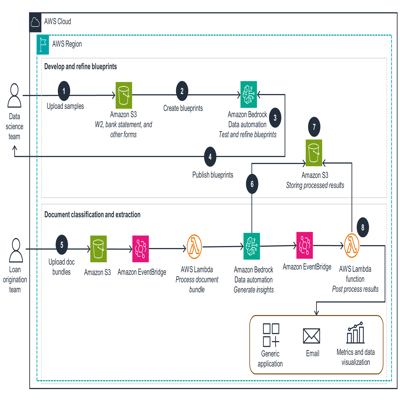

CHUNK 1
	 Generated  Response Text: 
	 ------------------------- 
	 Generated  Response Text:  5. The processed outputs, including extracted data and insights, are stored in S3 for access by various applications, email systems, and data visualization tools.
6. AWS services like AWS Lambda and Amazon EventBridge can be integrated into the workflow for event-driven processing and automation.

The key advantages of using BDA for this IDP workflow include the ability to process multimodal content (documents, images, video, audio) through a single API, customize outputs based on business needs, incorporate confidence scores and visual grounding for improved reliability, and mitigate hallucinations (generating incorrect information).

	 Retrieved References: 
	 ---------------------

		 --> Location: {'s3Location': {'uri': 's3://bedrock-bda-kb-708-1/bda/dataset/result_vid.json'}, 'type': 'S3'}
	
		 --> Metadata: 
			 ---> Source s3://bedrock-bda-kb-708-1/bda/dataset/result_vid.json
No image.

In [23]:
print_response(response)

## Clean Up
Let's delete the sample files that were uploaded to S3 and Bedrock Knowledge Base created using BDA as parser

In [ ]:
## Delete S3 Files

s3_client.delete_object(Bucket=bucket_name_kb, Key='bda/')

# Delete Knowledge Base

knowledge_base.delete_kb(delete_s3_bucket=True, delete_iam_roles_and_policies=False)


## Conclusion

By following this guide, you can effectively harness the power of Amazon Bedrock’s features to build a robust Multimodal RAG application tailored to your specific needs.